In [1]:
import matplotlib.pyplot as plt
from pylab import rcParams

In [2]:
import numpy as np
import pandas as pd
import os

In [3]:
import mne

In [4]:
import pandas as pd

In [5]:
from scipy.io import loadmat

In [6]:
from sklearn.preprocessing import StandardScaler

In [7]:
from sklearn.decomposition import IncrementalPCA

In [8]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

In [9]:
from sklearn.model_selection import GridSearchCV

In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

In [11]:
from sklearn.svm import SVC

In [12]:
from sklearn.ensemble import GradientBoostingClassifier

In [13]:
from sklearn.linear_model import LogisticRegression

In [14]:
import plotly.express as px

In [15]:
from sklearn.decomposition import PCA

In [16]:
from scipy.io import loadmat, savemat

In [17]:
from tqdm import tqdm_notebook

# Convert Data

In [18]:
for i in range(1, 11):
    subject = "s{}".format(i)

    session = loadmat('/tmp/{}.mat'.format(subject))

    channels = session[subject]['train'][0][0][1:9]

    trigger = (session[subject]['train'][0][0][9] > 0).astype(int)
    trigger[(trigger > 0) & (session[subject]['train'][0][0][10] == 0)] -= 2

    converted_session = {
        '__globals__': [],
         '__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Thu Jun 25 11:26:40 2020',
         '__version__': '1.0',
        'fs': np.array([[250]], dtype=np.uint8),
        'trig': trigger[:, np.newaxis],
        'y': channels.T
    }

    savemat('/tmp/{}.mat'.format(subject.upper()), converted_session)

In [19]:
MAIN_CHANNELS = ["Fz", "Cz", "P3", "Pz", "P4", "Po7", "Po8", "Oz"]

In [20]:
sfreq = 250

# Preprocess

In [21]:
def load_data(subject):
    channels = MAIN_CHANNELS
    
    session = loadmat('/tmp/{}.mat'.format(subject))

    session_df = pd.DataFrame(session["y"], columns=channels)

    sfreq = session["fs"][0][0]

    session_df["Time"] = session_df.index / session["fs"][0][0]

    session_df["Trigger"] = session["trig"]
    session_df.loc[session_df["Trigger"] == -1, "Trigger"] = 2
    
    return session_df

In [22]:
def restore_raw(session_df):
    channels = MAIN_CHANNELS + ['Trigger']
    info = mne.create_info(ch_names=channels, sfreq=sfreq)

    raw = mne.io.RawArray(session_df[channels].values.T, info)

    channel_types = {c: 'eeg' for c in channels}
    channel_types['Trigger'] = 'stim'

    raw.set_channel_types(channel_types)
    
    return raw

In [23]:
def filter_signal(raw):
    raw.notch_filter(50)
    raw.filter(0.5, 30)

In [24]:
def plot_raw(raw, start=0, stop=240, scale=100):
    rcParams['figure.figsize'] = 20, 10
    mne.viz.plot_raw(
        raw, 
        start=start, 
        duration=stop - start, 
        show=False, 
        n_channels=8,
        scalings={'eeg': scale}
    )
    plt.show()

In [25]:
def scale_signal(raw, session_df):
    channels = MAIN_CHANNELS + ['Trigger']
    
    channels_data = raw.copy().pick_types(eeg=True).get_data()

    trigger_data = session_df["Trigger"].values

    scaler = StandardScaler()

    scaled_channels_data = scaler.fit_transform(channels_data.T).T

    np.mean(scaled_channels_data, axis=1)

    new_channels_data = np.vstack([
        scaled_channels_data,
        trigger_data[np.newaxis, :]
    ])

    raw = mne.io.RawArray(new_channels_data, raw.info)
    
    channel_types = {c: 'eeg' for c in channels}
    channel_types['Trigger'] = 'stim'

    raw.set_channel_types(channel_types)
    
    return raw

In [26]:
def remove_artifacts(raw):
    ica = mne.preprocessing.ICA()

    ica.fit(raw)

    ica_eeg = ica.get_sources(raw)

    plt.figure(figsize=(10, 5))
    plt.plot(ica_eeg[:, :][0].T + 10 * np.arange(0, 8))

    stds = np.std(np.abs(ica_eeg[:, :][0]), axis=1)
    exclude_components = (-stds).argsort()[0:3]

    raw = ica.apply(raw.copy(), exclude=list(exclude_components))
    
    return raw

In [27]:
def get_epochs(raw):
    events = mne.find_events(raw, 'Trigger')
    
    epochs = mne.Epochs(
        raw.pick_types(eeg=True), 
        events, tmin=-0.1, tmax=0.7,
        reject_by_annotation=False,
        preload=True
    )
#     epochs = epochs.apply_baseline((-0.1, 0))
    return epochs

In [28]:
def show_p300_plots(epochs):
    epochs['1'].average().plot()
    plt.show()
    
    epochs['2'].average().plot()
    plt.show()

In [478]:
def detect_peak(epochs, window=10, start_time=200, end_time=450):
    time = np.linspace(-100, 800, 201)
    scores = epochs.average().data.mean(axis=0)
    
    scores_df = pd.DataFrame()
    scores_df["time"] = time
    scores_df.set_index('time', inplace=True)
    scores_df["score"] = scores
    
    scores_df["max"] = scores_df["score"].rolling(window, center=True).max() == scores_df["score"]
    scores_df["min"] = scores_df["score"].rolling(window, center=True).min() == scores_df["score"]
    
    max_peak = -1
    max_peak_latency = None

    for max_index, row in scores_df[scores_df["max"]].iterrows():
        max_score = row["score"]
        min_scores = scores_df[scores_df["min"] & (scores_df.index < max_index)]
        if min_scores.shape[0] == 0:
            continue
        min_score = min_scores.iloc[-1]["score"]
        difference = max_score - min_score

        if (max_index > start_time) & (max_index < end_time) & (difference > max_peak):
            max_peak = difference
            max_peak_latency = max_index
            
    scores_df["p300"] = False
    scores_df.loc[max_peak_latency, "p300"] = True
    
#     plt.figure(figsize=(10, 5))
#     plt.plot(scores_df.index, scores_df["score"])
#     plt.scatter(scores_df[scores_df["max"]].index, scores_df[scores_df["max"]]["score"])
#     plt.scatter(scores_df[scores_df["min"]].index, scores_df[scores_df["min"]]["score"])
#     plt.scatter(scores_df[scores_df["p300"]].index, scores_df[scores_df["p300"]]["score"], s=1000)
    
    return max_peak_latency, scores_df.loc[max_peak_latency]["score"]

In [553]:
def extract_features(subject, epochs, sliding_window_size=30):
    features = []
    
    for i in tqdm_notebook(range(sliding_window_size, 150)):
        sliding_epochs = epochs['1'][i - sliding_window_size:i]
        
        try:
            latency, amplitude = detect_peak(sliding_epochs)

            features.append((latency, amplitude, subject, i))
        except KeyError:
            pass

    return features

In [554]:
def process_signal(i, features_extraction=True):
    subject = "S{}".format(i)
    session_df = load_data(subject)
    raw = restore_raw(session_df)
    plot_raw(raw)
    
    filter_signal(raw)
    raw = remove_artifacts(raw)
    raw = scale_signal(raw, session_df)
    
    plot_raw(raw, scale=10)
    
    epochs = get_epochs(raw)    
    show_p300_plots(epochs)
    
    if features_extraction:
        return extract_features(subject, epochs)
    else:
        return epochs

# P300 detection using MeanShift

In [555]:
# epochs = process_signal(6, features_extraction=False)

In [556]:
# detect_peak(epochs)

# Get features

Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-22-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



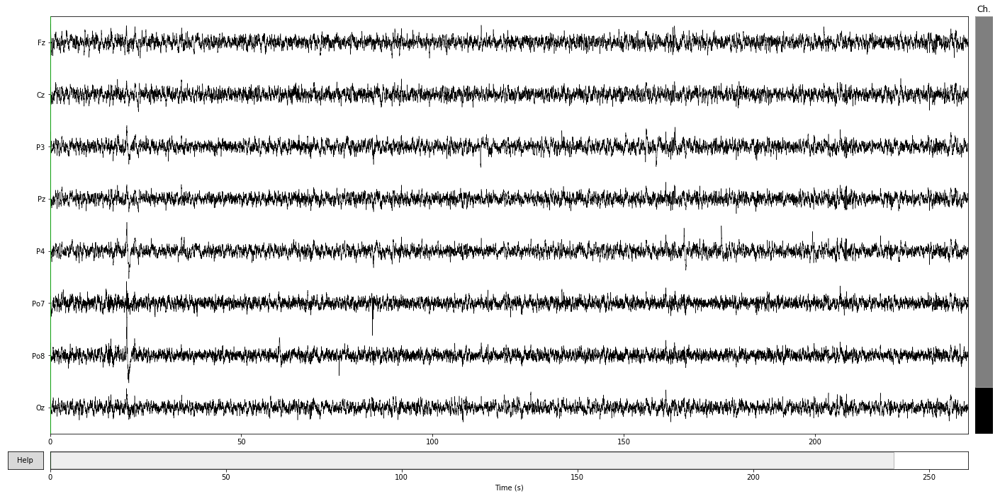

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.


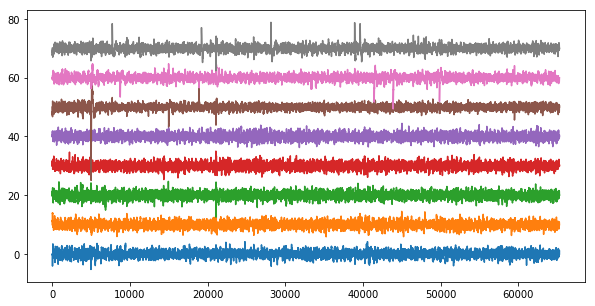

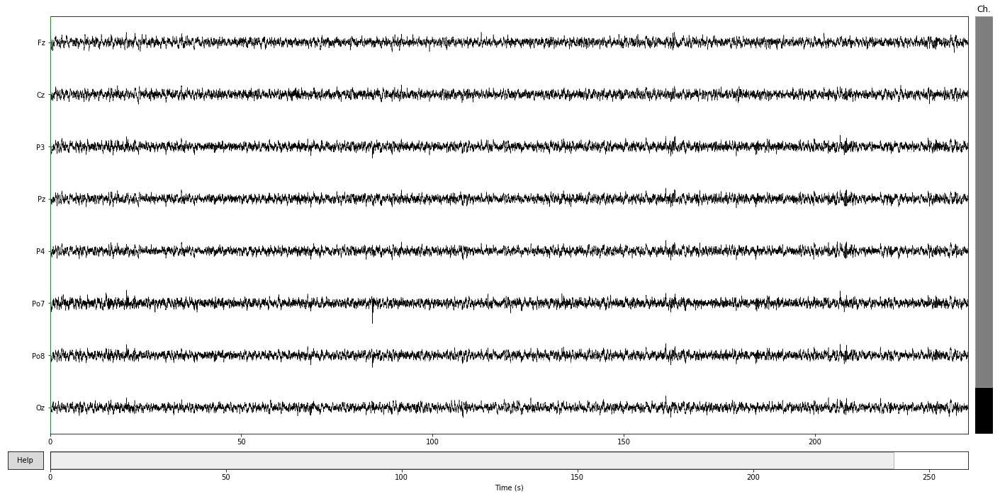

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-28-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



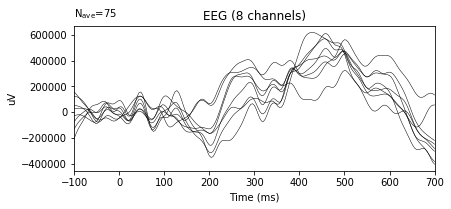

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-28-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



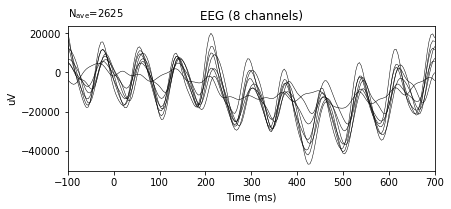

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


/usr/local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/site-packages/numpy/core/_methods.py:154: RuntimeWarning:

invalid value encountered in true_divide

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWar

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWar

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWar

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)

Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-22-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



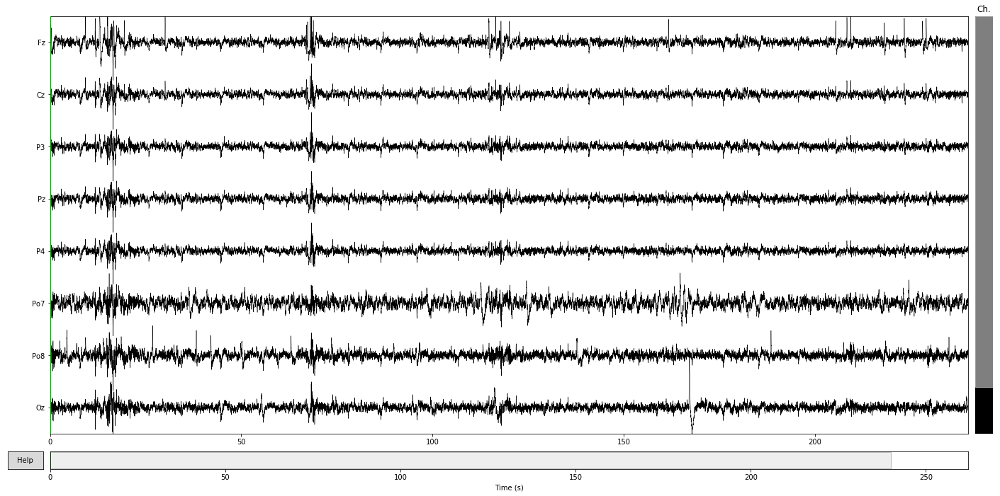

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.


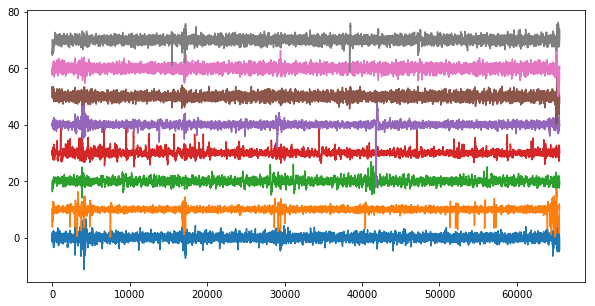

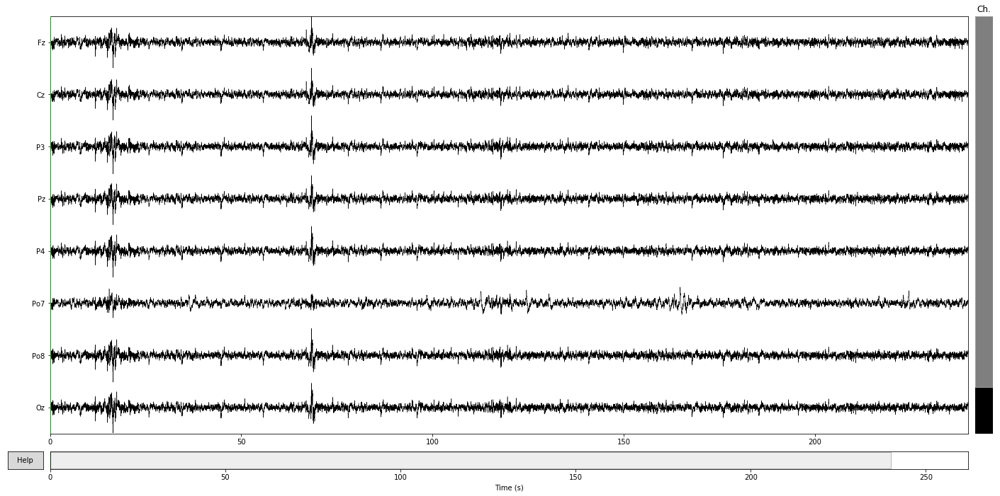

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-28-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



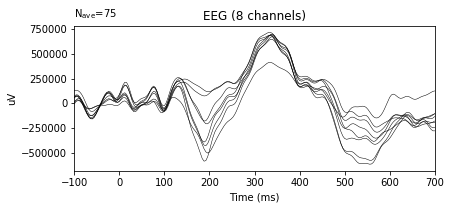

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-28-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



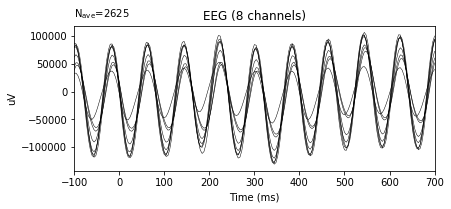

evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


/usr/local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/site-packages/numpy/core/_methods.py:154: RuntimeWarning:

invalid value encountered in true_divide

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)

<ipython-input-478-1c8c94ae5495>:3: RuntimeWarning:

evoked object is empty (based on less than 1 epoch)



evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)
evoked object is empty (based on less than 1 epoch)


In [ ]:
all_features = []

for i in range(1, 11):
    features = process_signal(i)
    all_features += features

# Visualization of subject differences

In [ ]:
all_features_df = pd.DataFrame(all_features, columns=["latency", "amplitude", "subject", "trial"])

In [ ]:
all_features_df.head()

In [ ]:
all_features_df["trial_converted"] = (all_features_df["trial"] - all_features_df["trial"].min()) / (all_features_df["trial"].max() - all_features_df["trial"].min())

In [ ]:
px.scatter(
    all_features_df, 
    x="latency", 
    y="amplitude", 
    color="subject",
    size="trial_converted"
)

# Create feature array

Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



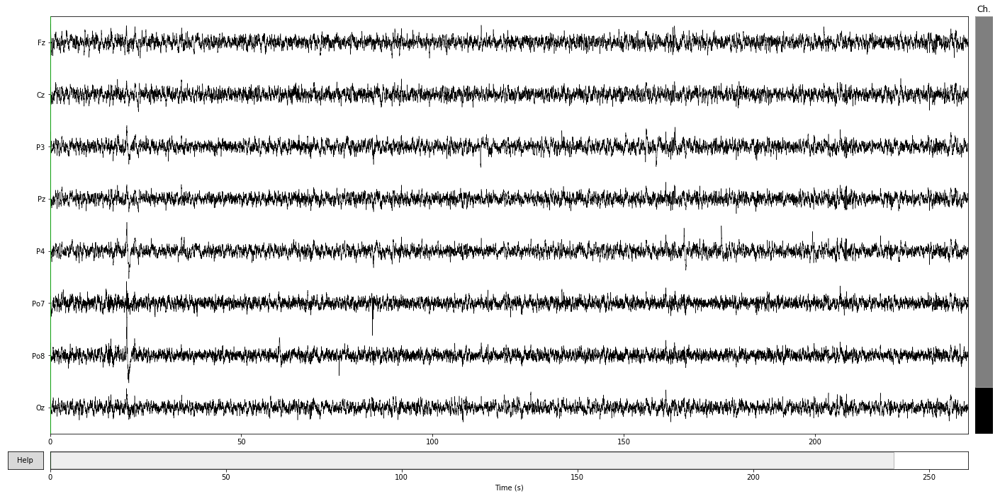

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.7s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.


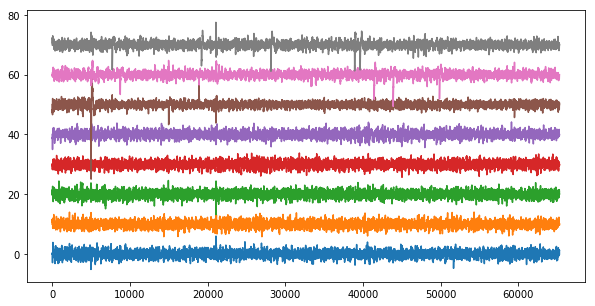

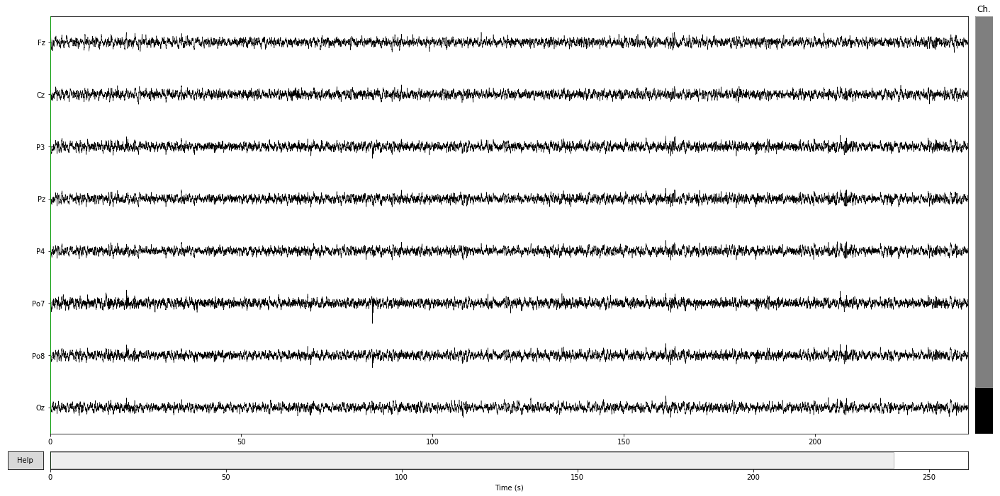

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



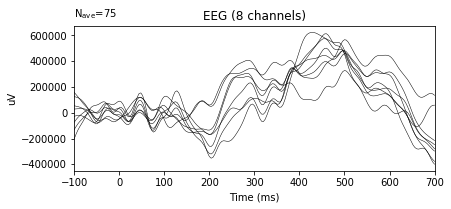

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



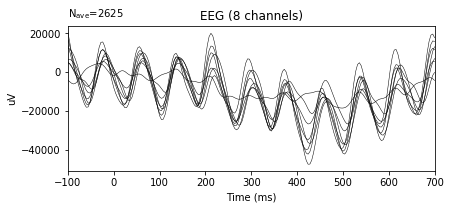

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



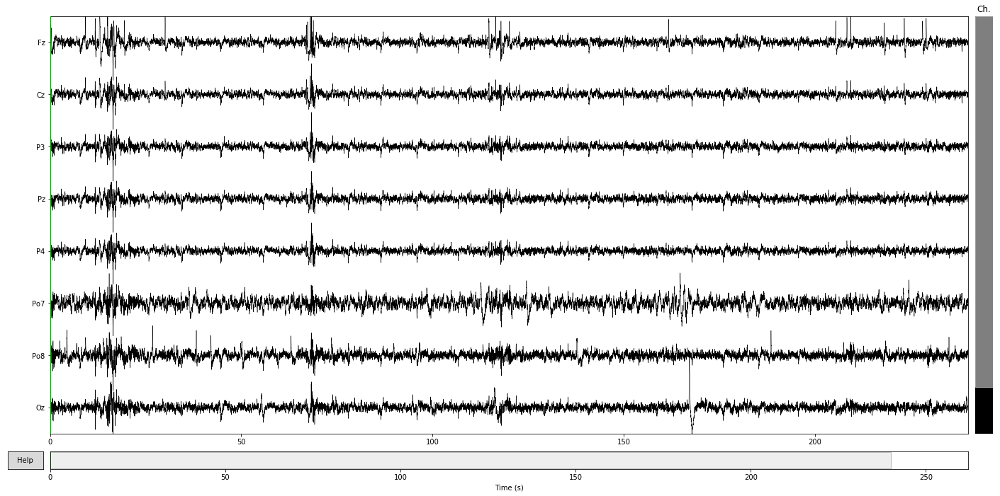

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.5s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.


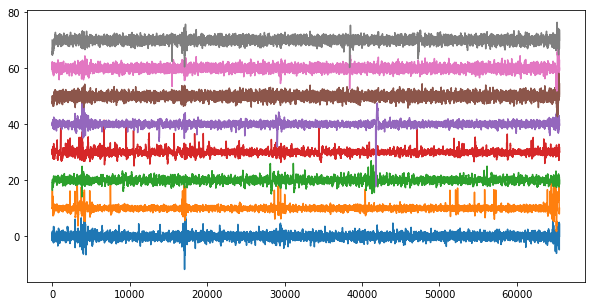

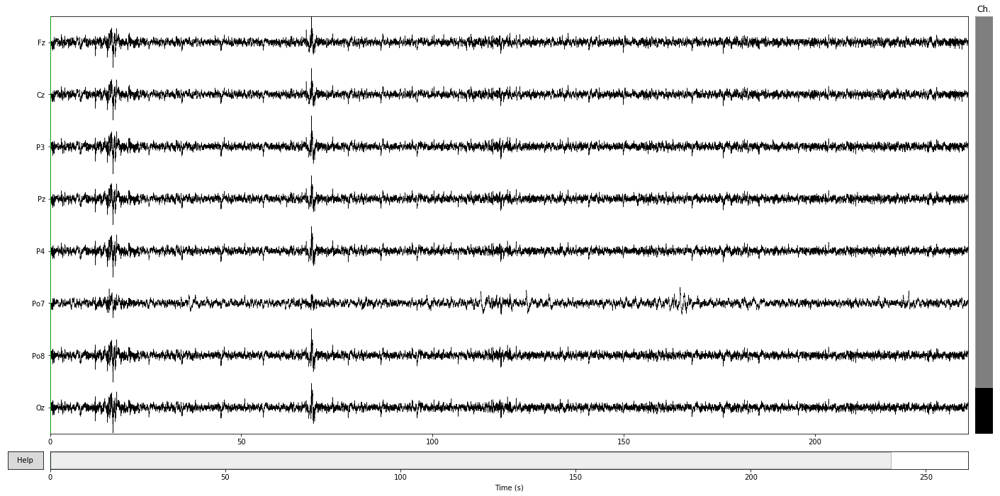

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



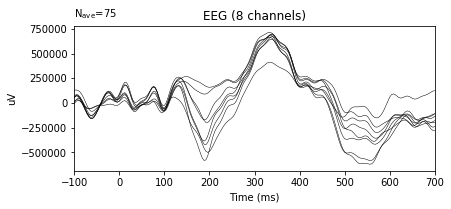

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



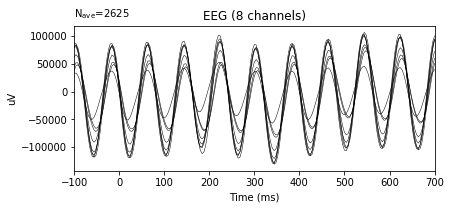

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



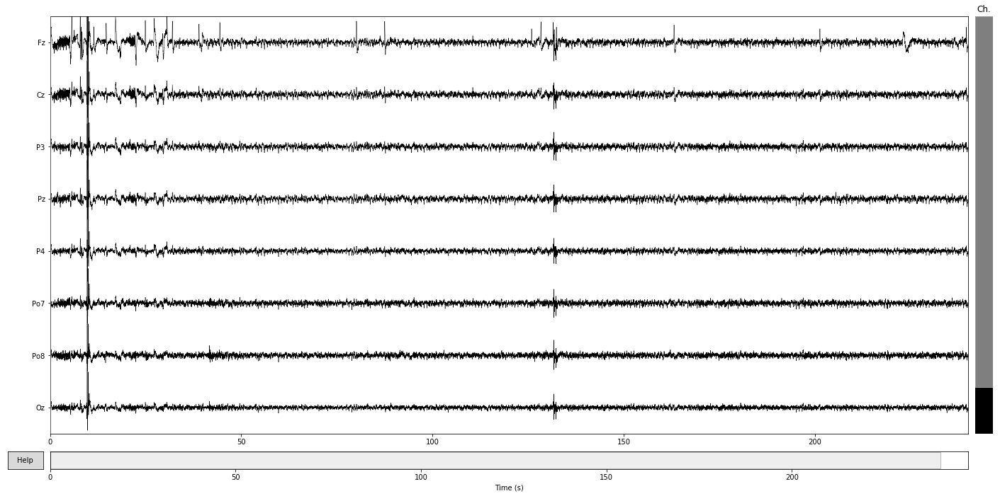

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.6s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.


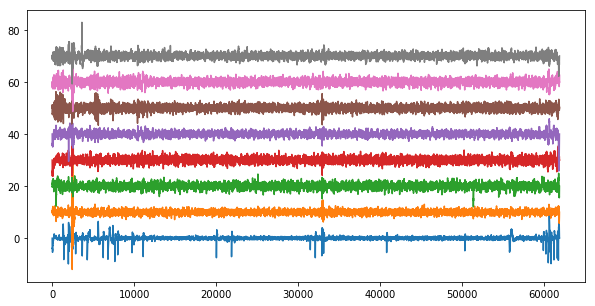

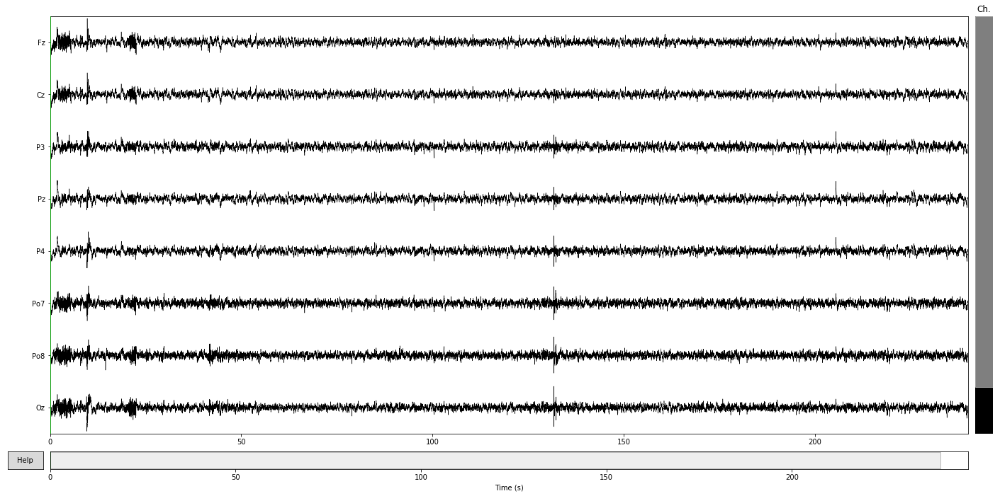

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



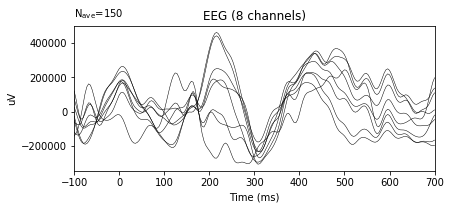

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



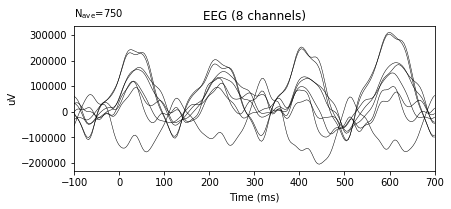

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



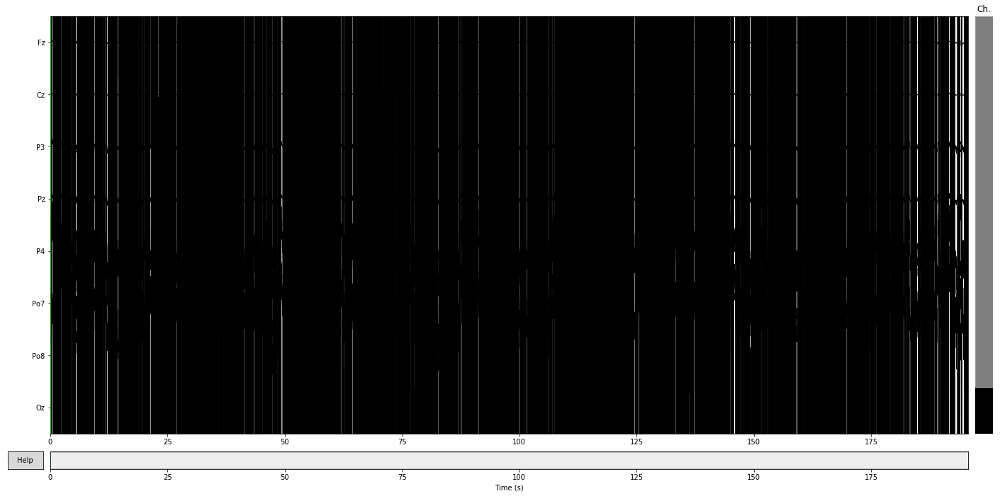

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.


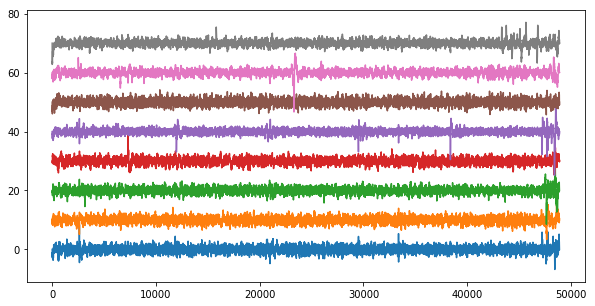

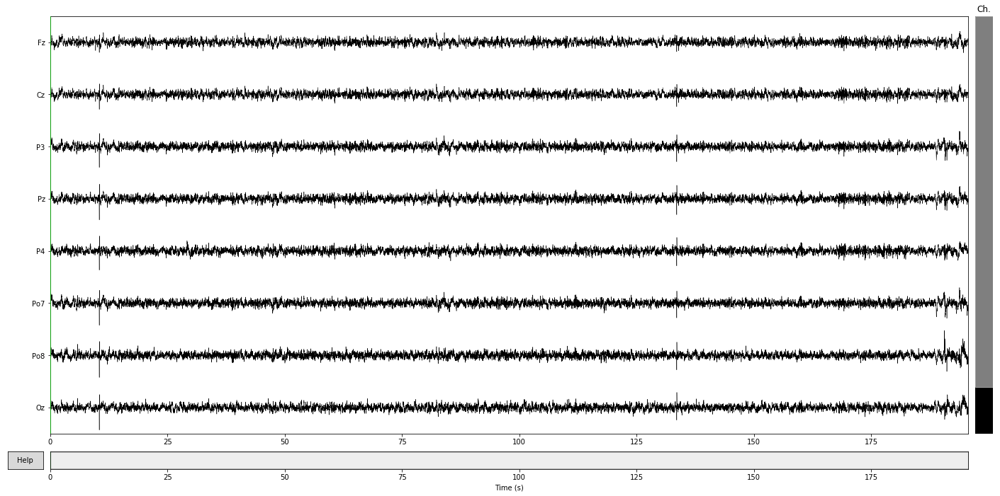

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



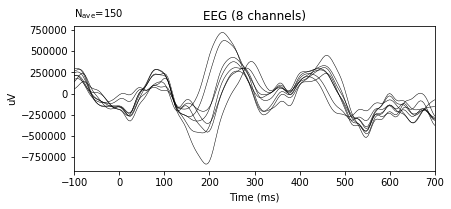

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



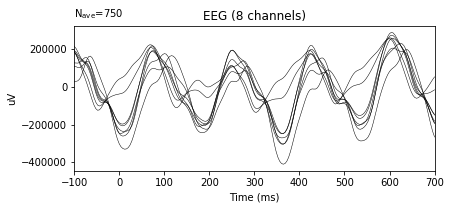

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



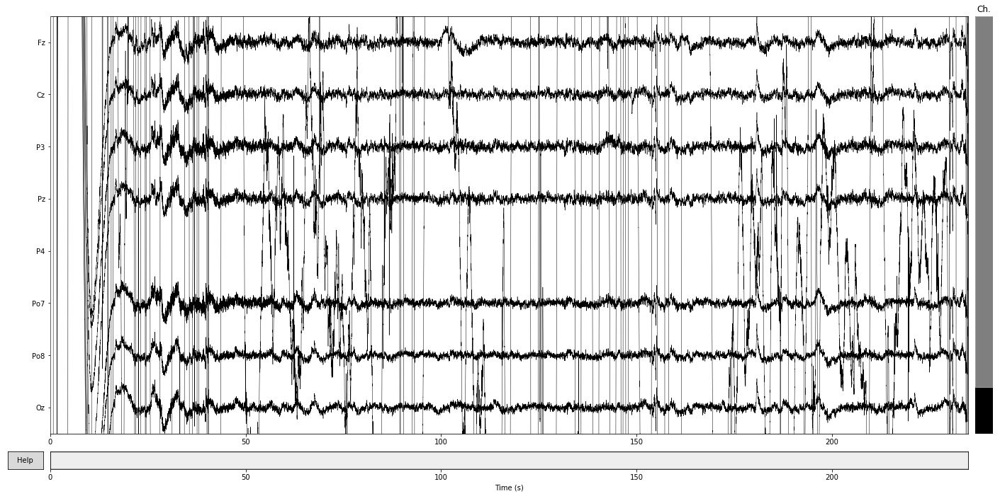

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.


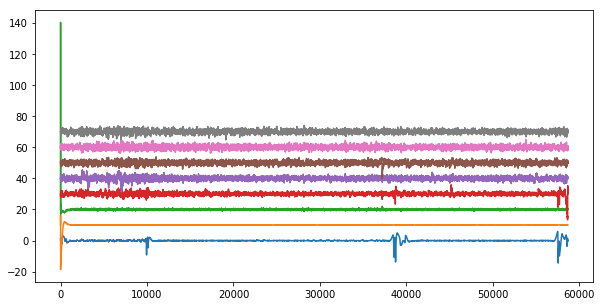

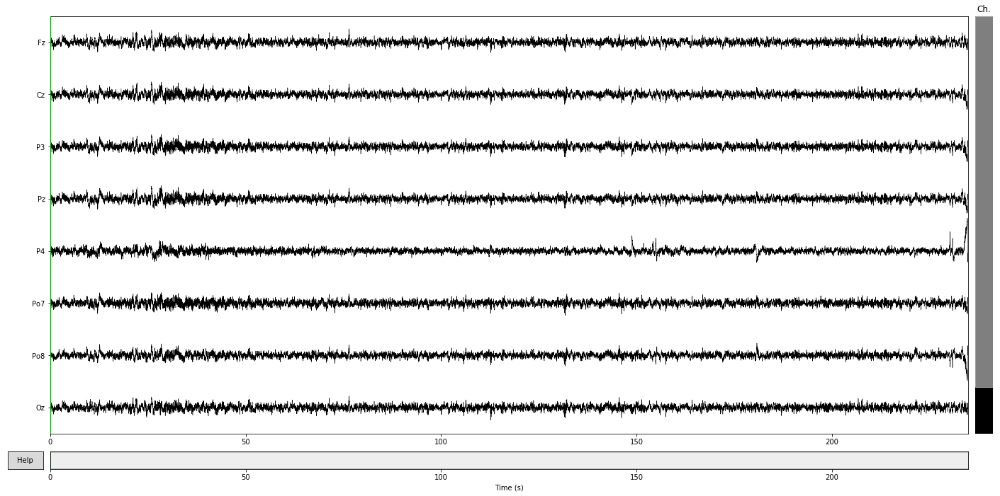

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



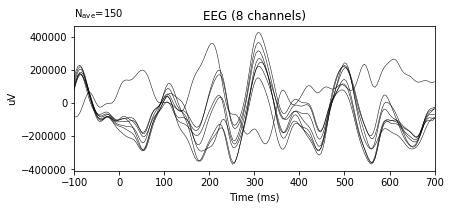

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



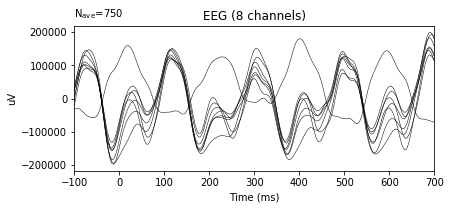

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



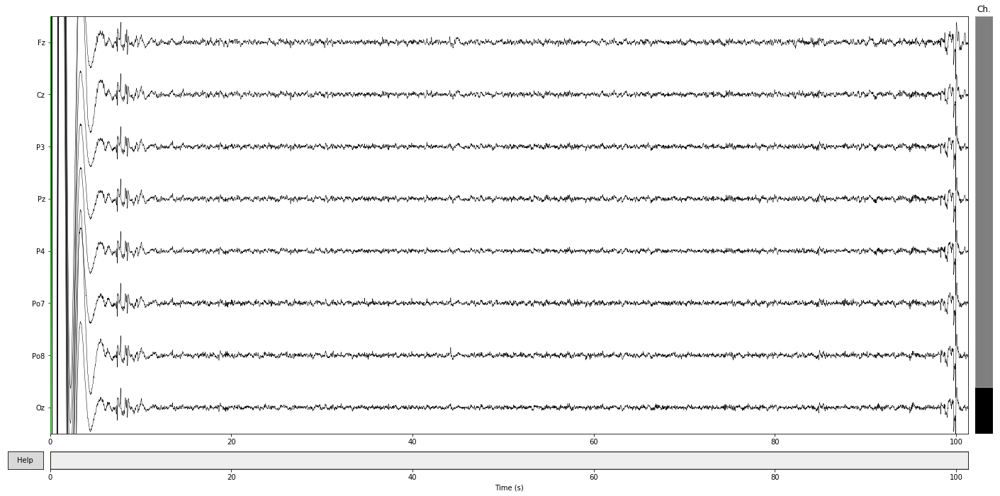

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.


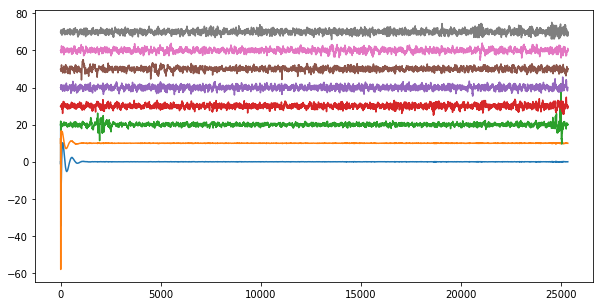

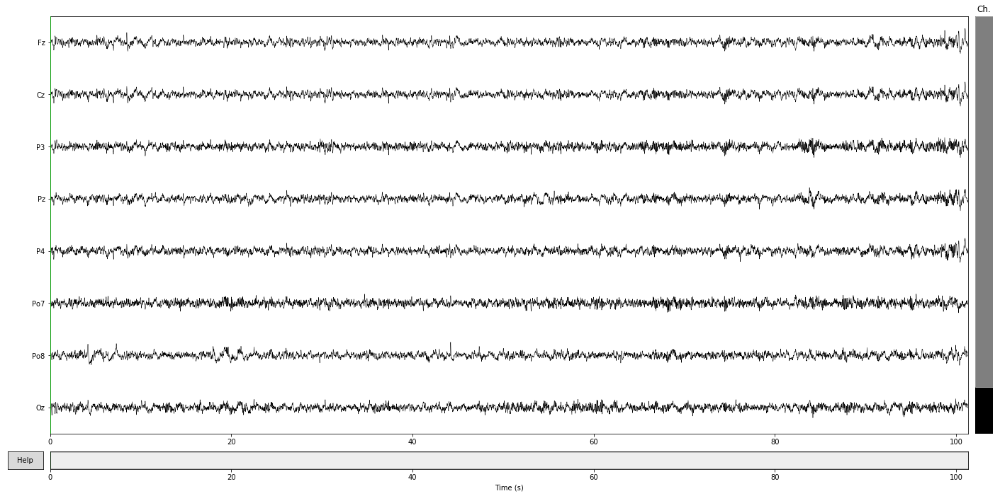

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



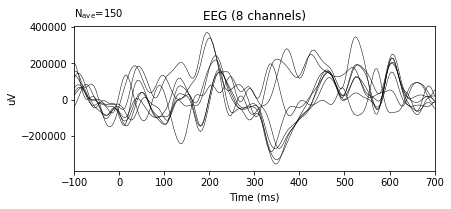

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



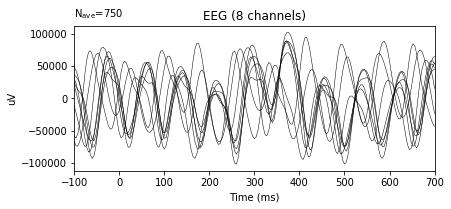

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



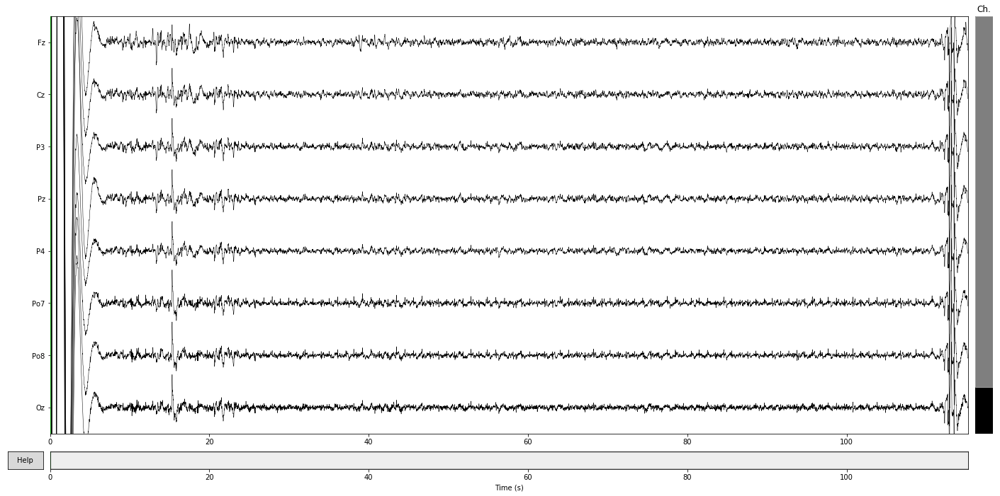

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.


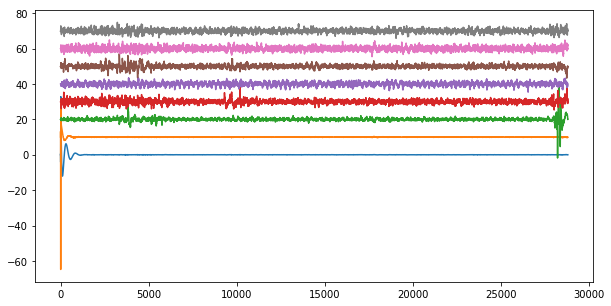

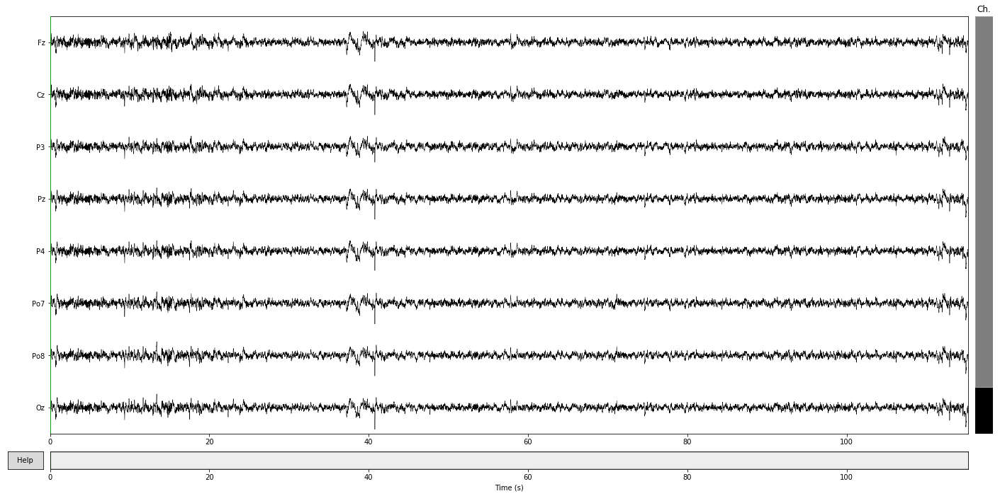

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



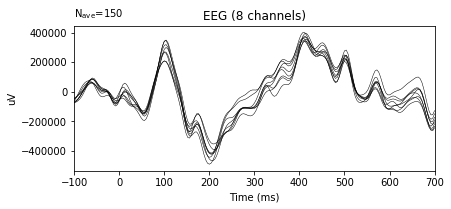

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



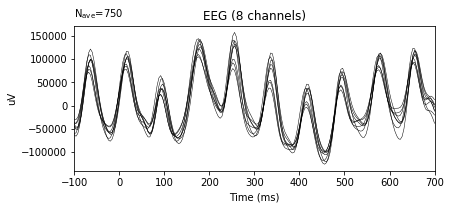

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



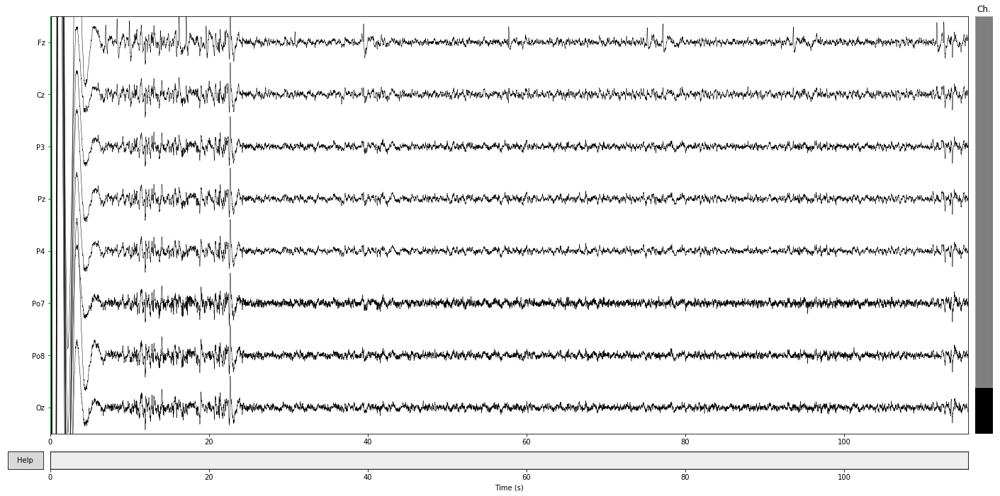

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.


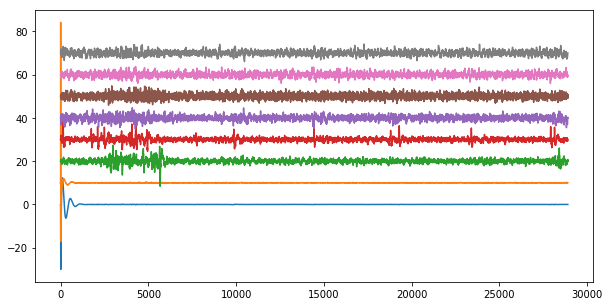

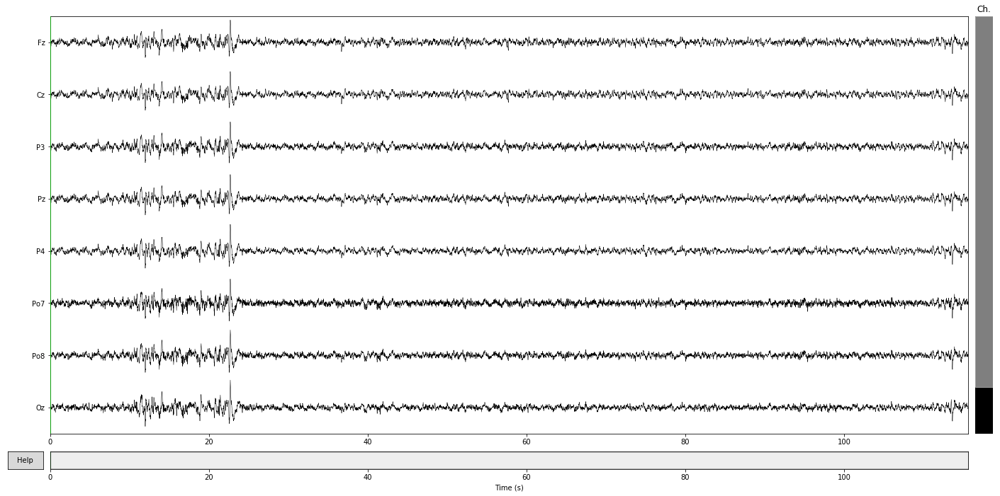

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



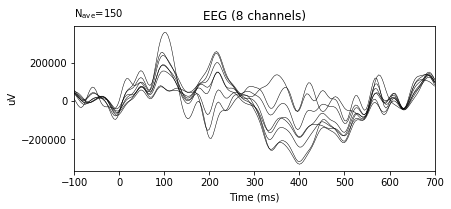

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



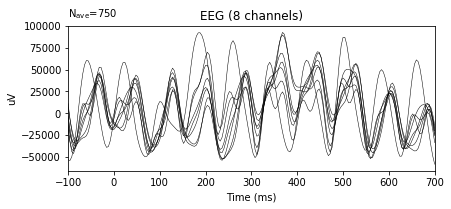

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



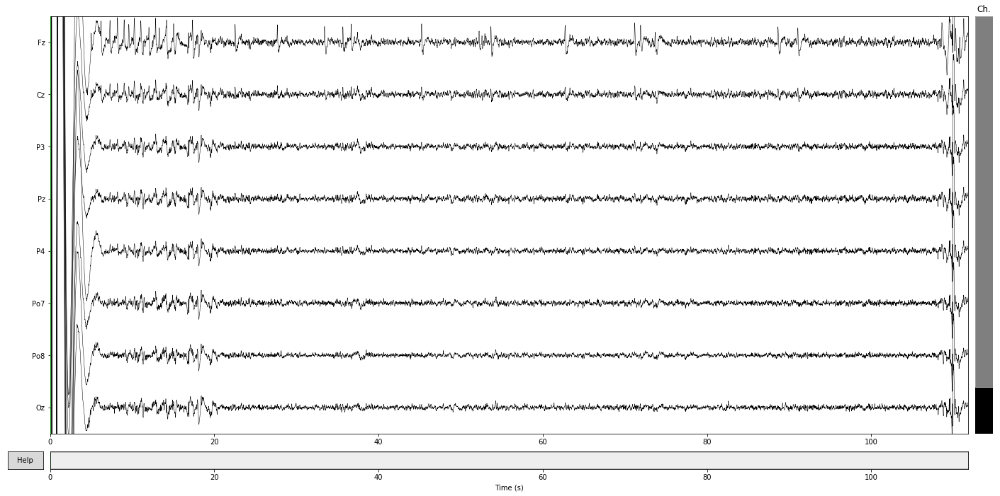

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.


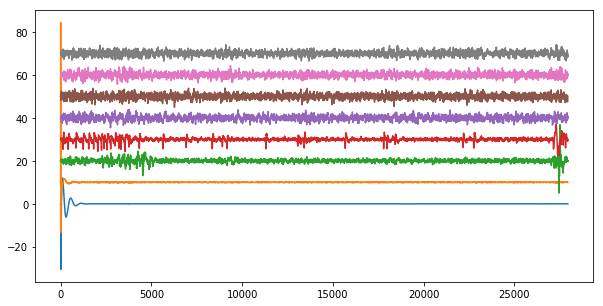

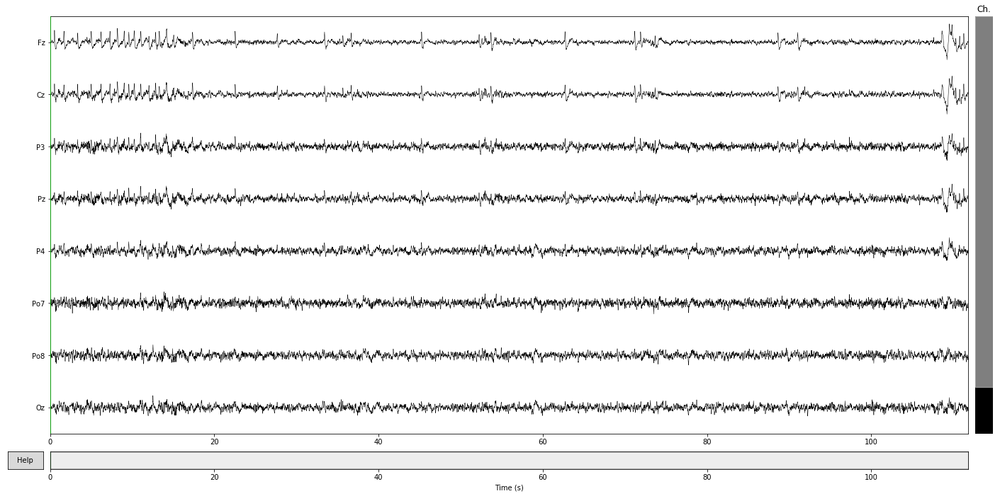

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



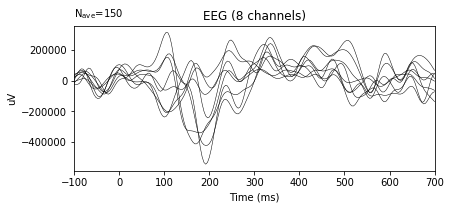

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



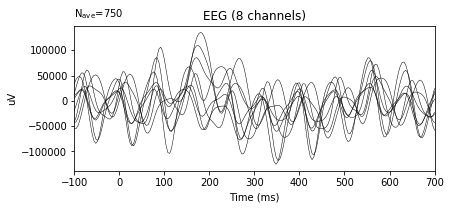

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



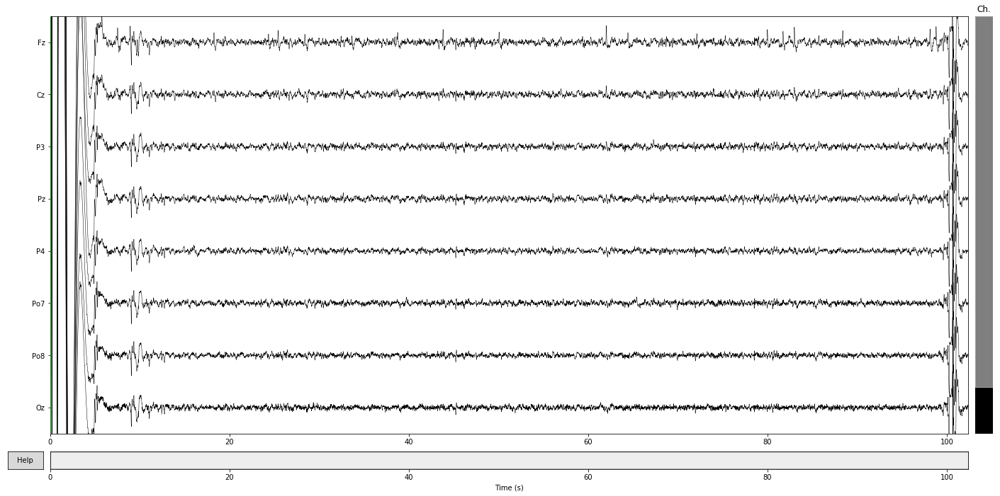

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.


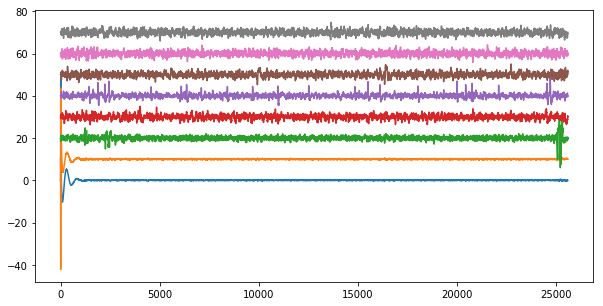

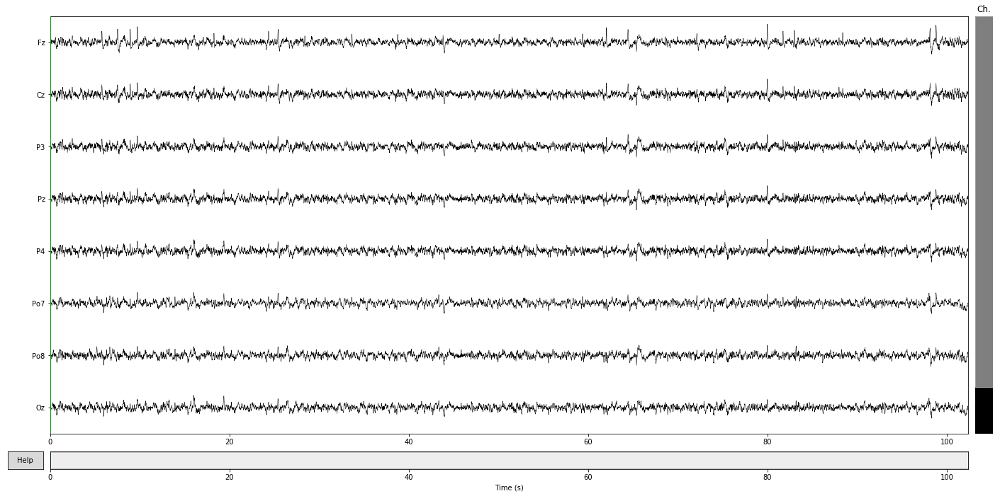

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



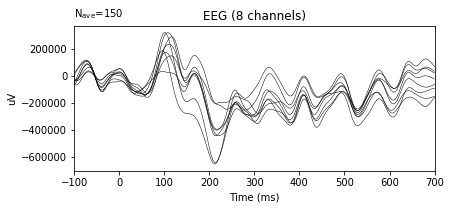

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



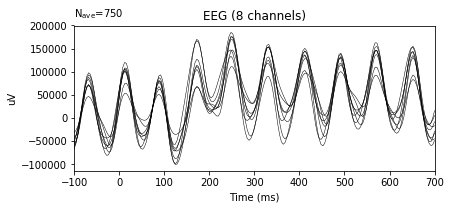

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.



In [35]:
all_epochs = []

for i in range(1, 11):
    epochs = process_signal(i, features_extraction=False)
    epochs = epochs.decimate(12)
    all_epochs += [epochs]

In [36]:
def get_dataset(epochs, class_label):
    events_X = epochs.get_data()
    events_X = events_X.reshape(events_X.shape[0], -1)
    
    events_y = [class_label] * events_X.shape[0]
    
    return events_X, events_y

In [37]:
i = 1

In [38]:
all_events_X = []
all_events_y = []

for epochs in all_epochs[i:i + 1]:
    positive_events_X, positive_events_y = get_dataset(epochs['1'], 1)
    negative_events_X, negative_events_y = get_dataset(epochs['2'], 0)
    
    all_events_X += [positive_events_X] + [negative_events_X]
    all_events_y += positive_events_y + negative_events_y

In [39]:
merged_events_X = np.vstack(all_events_X)

 # LDA decomposition and classification

In [43]:
def get_metric(model, grid, scoring="accuracy", return_model = False):
    search = GridSearchCV(model, grid, cv=3, scoring=scoring)
    search.fit(merged_events_X, all_events_y)
    if return_model:
        return search.best_estimator_
    return search.best_score_

Classification

In [44]:
grid = {
    "solver": ['svd']
}
model = LDA()
get_metric(model, grid)

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



0.97

In [45]:
get_metric(model, grid, scoring= "roc_auc")

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



0.8734476190476191

Visualization

In [46]:
all_events_y[-1] = 2 # Hack to get 2 components for decomposition

In [47]:
lda = get_metric(model, grid, return_model=True, scoring="accuracy")

/usr/local/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



In [48]:
all_events_y[-1] = 0

In [49]:
def visualize_importances(importances):
    time = np.linspace(-100, 700, 17)
    for channel, values in zip(MAIN_CHANNELS, importances.reshape(8, -1)): 
        plt.plot(time, values, label=channel)
    plt.legend()
    plt.axvline(0, linestyle=":")

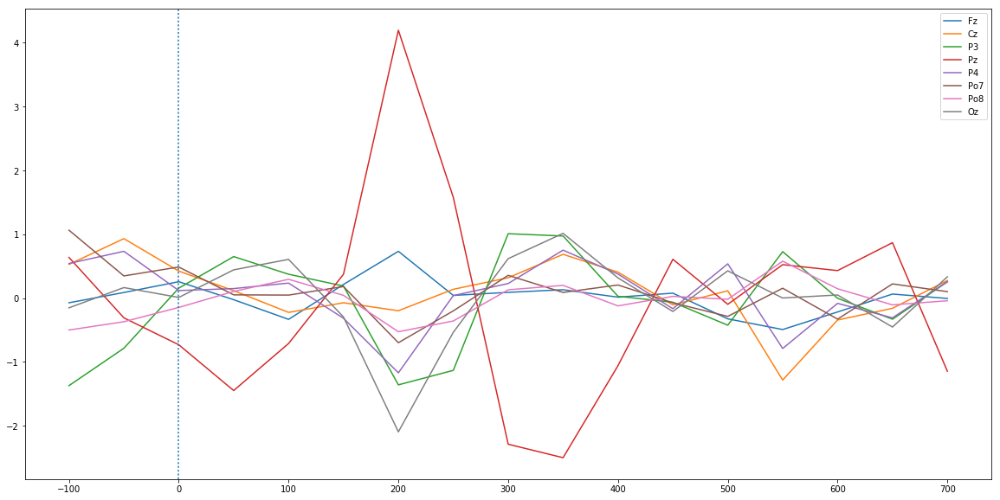

In [50]:
visualize_importances(lda.coef_[1])

In [51]:
lda_features = lda.transform(merged_events_X)

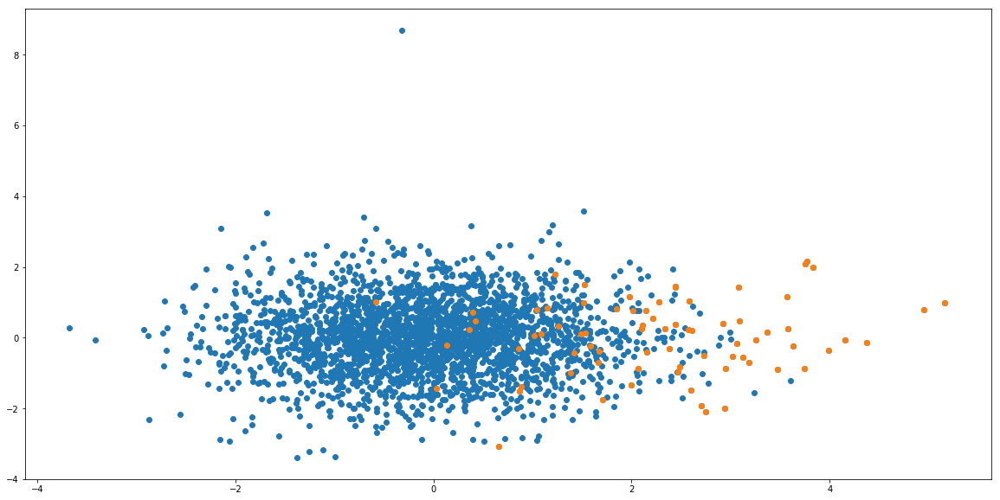

In [52]:
positive_indices = np.array(all_events_y) == 1

plt.scatter(lda_features.T[0], lda_features.T[1])
plt.scatter(lda_features.T[0][positive_indices], lda_features.T[1][positive_indices])

# Tree ensembles

In [53]:
grid = {
    "n_estimators": [10, 100],
    "max_depth": [3]
}
model = GradientBoostingClassifier()
# get_metric(model, grid)

In [54]:
get_metric(model, grid, scoring='roc_auc')

0.7134476190476191

In [55]:
ensemble = get_metric(model, grid, scoring='roc_auc', return_model=True)

In [56]:
ensemble

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

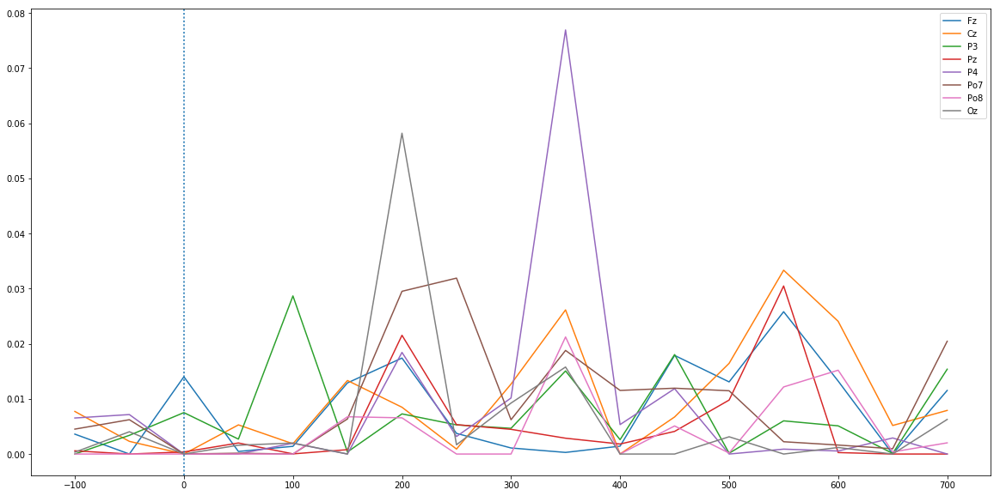

In [57]:
visualize_importances(ensemble.feature_importances_)

# Logistic Regression and Linear SVM

In [58]:
# grid = {
#     "reg_param": [0] + np.logspace(-2, 0, 100).tolist()
# }
# model = QDA()
# get_metric(model, grid, "roc_auc")

In [59]:
# get_metric(model, grid, "roc_auc", return_model=True)

In [60]:
grid = {
    "C": np.logspace(-3, 0, 20).tolist(),
    "kernel": ['linear', 'poly', 'rbf', 'sigmoid']
}
model = SVC(gamma='scale')
get_metric(model, grid, "roc_auc")

0.8522819047619047

In [61]:
svm = get_metric(model, grid, "roc_auc", return_model=True)

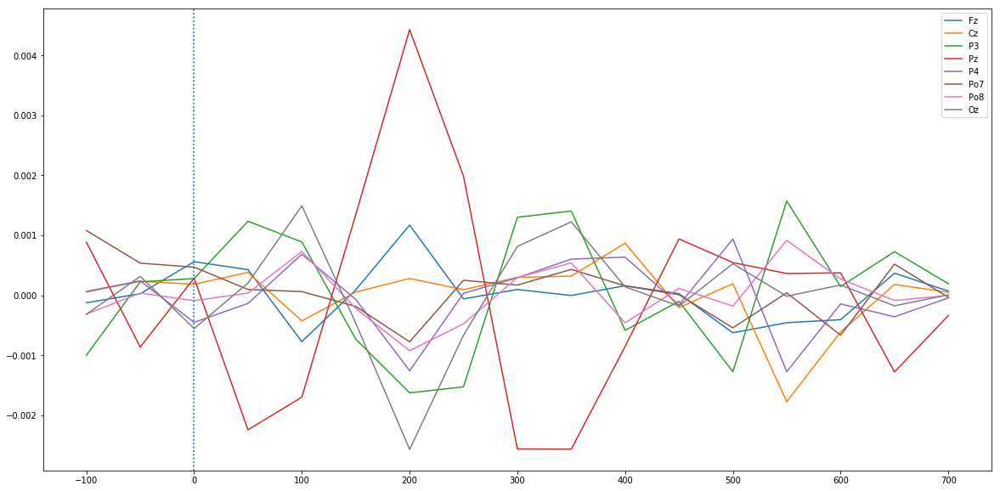

In [62]:
visualize_importances(svm.coef_[0])

In [63]:
grid = {
    "C": np.logspace(-3, 1, 100).tolist()
}
model = LogisticRegression(solver='liblinear')
get_metric(model, grid, "roc_auc")

0.8586209523809524

In [64]:
logreg = get_metric(model, grid, "roc_auc", return_model=True)

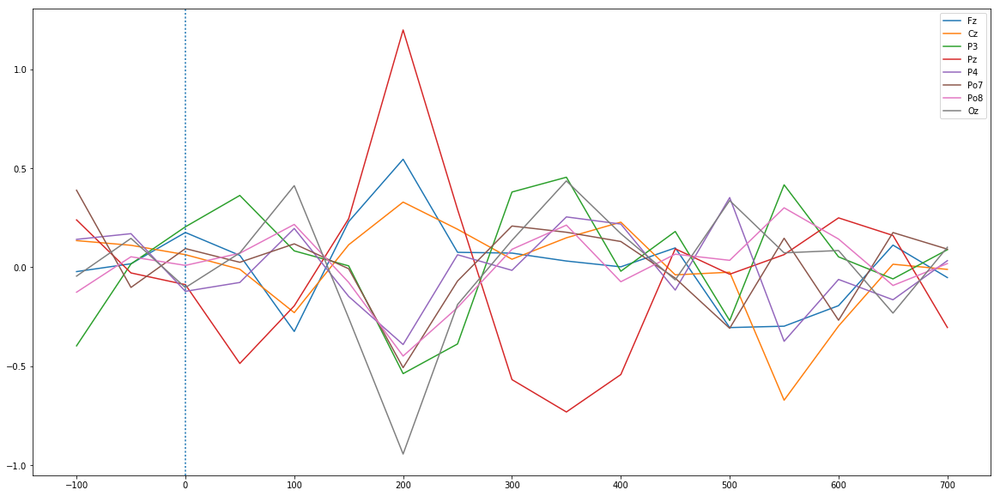

In [65]:
visualize_importances(logreg.coef_[0])

# TODO The sections below are experimental!

# Why some samples are not so good to classify?

In [66]:
grid = {
    "solver": ['svd']
}
model = LDA()

In [68]:
lda = get_metric(model, grid, return_model=True, scoring="roc_auc")

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



In [69]:
probabilities = lda.predict_proba(merged_events_X).T[1]

In [70]:
positive_indices = np.array(all_events_y) == 1

In [71]:
positive_events = merged_events_X[positive_indices]

In [72]:
correction_classes = probabilities[positive_indices] < 0.5

In [73]:
features_df = pd.DataFrame()

In [74]:
features_df["class"] = correction_classes

In [75]:
reshaped_positive_events = positive_events.reshape(positive_events.shape[0], 8, -1)

In [76]:
for index, channel in enumerate(MAIN_CHANNELS):
    features_df["mean_{}".format(channel)] = reshaped_positive_events[:, index, :].mean(axis=-1)
    features_df["std_{}".format(channel)] = reshaped_positive_events[:, index, :].std(axis=-1)

In [77]:
closest_pairs = [
    ("Fz", "Cz"),
    ("Cz", "Pz"),
    ("P3", "Pz"),
    ("Pz", "P4"),
    ("Po7", "P3"),
    ("Po8", "P4"),
    ("Pz", "Oz")
]

In [78]:
for (c1, c2) in closest_pairs:
    print(c1, c2)
    index1 = MAIN_CHANNELS.index(c1)
    index2 = MAIN_CHANNELS.index(c2)
    coefs = []
    for attemp in reshaped_positive_events:
        coefs.append(np.corrcoef(attemp[index1], attemp[index2])[0, 1])
    features_df["cov_{}_{}".format(c1, c2)] = coefs

Fz Cz
Cz Pz
P3 Pz
Pz P4
Po7 P3
Po8 P4
Pz Oz


In [79]:
all_features += [features_df]

In [87]:
all_features

[(376, 0.13182574624909132, 'S1', 30),
 (376, 0.18070325597996462, 'S1', 31),
 (376, 0.17225041555222534, 'S1', 32),
 (380, 0.09485586302403003, 'S1', 33),
 (380, 0.07372481209019453, 'S1', 34),
 (380, 0.12578760460237073, 'S1', 35),
 (376, 0.1464955824661882, 'S1', 36),
 (380, 0.11706191673611335, 'S1', 37),
 (292, 0.01799166641252909, 'S1', 38),
 (380, 0.21031729191244006, 'S1', 39),
 (336, 0.08353252595643819, 'S1', 40),
 (288, 0.09734501837554962, 'S1', 41),
 (284, 0.15697369285632248, 'S1', 42),
 (284, 0.21286519842926394, 'S1', 43),
 (284, 0.2215057809333127, 'S1', 44),
 (288, 0.2217403568292397, 'S1', 45),
 (288, 0.2978787412184705, 'S1', 46),
 (288, 0.3926056655148599, 'S1', 47),
 (288, 0.38224753377386356, 'S1', 48),
 (288, 0.521134756764688, 'S1', 49),
 (288, 0.5000356171880427, 'S1', 50),
 (288, 0.4901899216848666, 'S1', 51),
 (284, 0.4922491734237401, 'S1', 52),
 (284, 0.4172704421774002, 'S1', 53),
 (288, 0.3817389849500633, 'S1', 54),
 (288, 0.40835247435686195, 'S1', 55)

In [80]:
all_features_df = pd.concat(all_features).reset_index(drop=True)

TypeError: cannot concatenate object of type "<class 'tuple'>"; only pd.Series, pd.DataFrame, and pd.Panel (deprecated) objs are valid

In [81]:
# for c1, c2 in closest_pairs:
#     all_features_df[all_features_df["class"]]["cov_{}_{}".format(c1, c2)].plot(kind='hist', alpha=0.5, normed=True)
#     all_features_df[~all_features_df["class"]]["cov_{}_{}".format(c1, c2)].plot(kind='hist', alpha=0.5, normed=True)
#     plt.show()

In [82]:
model = SVC(gamma='scale', kernel='linear')
grid = {"C": np.logspace(-5, -2, 100)}
# grid = {"n_estimators": [1000]}
search = GridSearchCV(model, grid, cv=3, scoring="roc_auc")
search.fit(all_features_df.drop(columns="class"), all_features_df["class"])

KeyError: "['class'] not found in axis"

In [ ]:
search.best_estimator_

In [ ]:
search.best_score_

In [ ]:
eli5.explain_weights(search.best_estimator_, feature_names=list(all_features_df.drop(columns=["class"]).columns), top=100)

In [ ]:
import eli5

In [ ]:
all_features = []